<a href="https://colab.research.google.com/github/roshank1605A04/Twitter-Sentiment-Analysis/blob/master/Twitter_Sentiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [73]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import warnings

In [74]:
train = pd.read_csv('train_tweet.csv')
test = pd.read_csv('test_tweets.csv')

print(train.shape)
print(test.shape)

(31962, 3)
(17197, 2)


In [75]:
train.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [76]:
test.head()

,id,tweet
0,31963,#studiolife #aislife #requires #passion #dedic...
1,31964,@user #white #supremacists want everyone to s...
2,31965,safe ways to heal your #acne!! #altwaystohe...
3,31966,is the hp and the cursed child book up for res...
4,31967,"3rd #bihday to my amazing, hilarious #nephew..."


In [77]:
train.isnull().any()
test.isnull().any()

id       False
tweet    False
dtype: bool

In [78]:
# checking out the negative comments from the train set

train[train['label'] == 0].head(10)

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation
5,6,0,[2/2] huge fan fare and big talking before the...
6,7,0,@user camping tomorrow @user @user @user @use...
7,8,0,the next school year is the year for exams.ð...
8,9,0,we won!!! love the land!!! #allin #cavs #champ...
9,10,0,@user @user welcome here ! i'm it's so #gr...


In [79]:
# checking out the postive comments from the train set 

train[train['label'] == 1].head(10)

,id,label,tweet
13,14,1,@user #cnn calls #michigan middle school 'buil...
14,15,1,no comment! in #australia #opkillingbay #se...
17,18,1,retweet if you agree!
23,24,1,@user @user lumpy says i am a . prove it lumpy.
34,35,1,it's unbelievable that in the 21st century we'...
56,57,1,@user lets fight against #love #peace
68,69,1,ð©the white establishment can't have blk fol...
77,78,1,"@user hey, white people: you can call people '..."
82,83,1,how the #altright uses &amp; insecurity to lu...
111,112,1,@user i'm not interested in a #linguistics tha...


<Axes: >

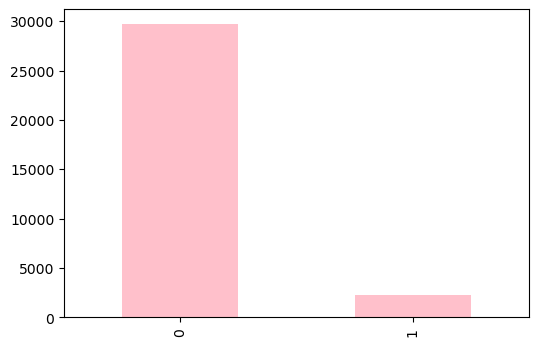

In [80]:
train['label'].value_counts().plot.bar(color = 'pink', figsize = (6, 4))

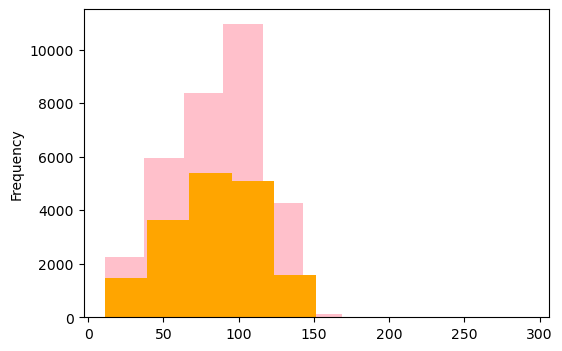

In [81]:
# checking the distribution of tweets in the data

length_train = train['tweet'].str.len().plot.hist(color = 'pink', figsize = (6, 4))
length_test = test['tweet'].str.len().plot.hist(color = 'orange', figsize = (6, 4))

In [82]:
# adding a column to represent the length of the tweet

train['len'] = train['tweet'].str.len()
test['len'] = test['tweet'].str.len()

train.head(10)

,id,label,tweet,len
0,1,0,@user when a father is dysfunctional and is s...,102
1,2,0,@user @user thanks for #lyft credit i can't us...,122
2,3,0,bihday your majesty,21
3,4,0,#model i love u take with u all the time in ...,86
4,5,0,factsguide: society now #motivation,39
5,6,0,[2/2] huge fan fare and big talking before the...,116
6,7,0,@user camping tomorrow @user @user @user @use...,74
7,8,0,the next school year is the year for exams.ð...,143
8,9,0,we won!!! love the land!!! #allin #cavs #champ...,87
9,10,0,@user @user welcome here ! i'm it's so #gr...,50


In [83]:

train.groupby('label').describe()

id                                                               \
         count          mean          std   min      25%      50%       75%   
label                                                                         
0      29720.0  15974.454441  9223.783469   1.0  7981.75  15971.5  23965.25   
1       2242.0  16074.896075  9267.955758  14.0  8075.25  16095.0  24022.00   

                    len                                                        
           max    count       mean        std   min   25%   50%    75%    max  
label                                                                          
0      31962.0  29720.0  84.328634  29.566484  11.0  62.0  88.0  107.0  274.0  
1      31961.0   2242.0  90.187779  27.375502  12.0  69.0  96.0  111.0  152.0

C:\Users\vishn\AppData\Local\Temp\ipykernel_23648\3421818104.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  train.groupby('len').mean()['label'].plot.hist(color = 'black', figsize = (6, 4),)


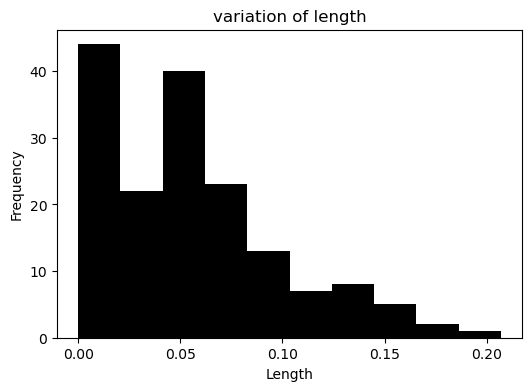

In [84]:
train.groupby('len').mean()['label'].plot.hist(color = 'black', figsize = (6, 4),)
plt.title('variation of length')
plt.xlabel('Length')
plt.show()

Text(0.5, 1.0, 'Most Frequently Occuring Words - Top 30')

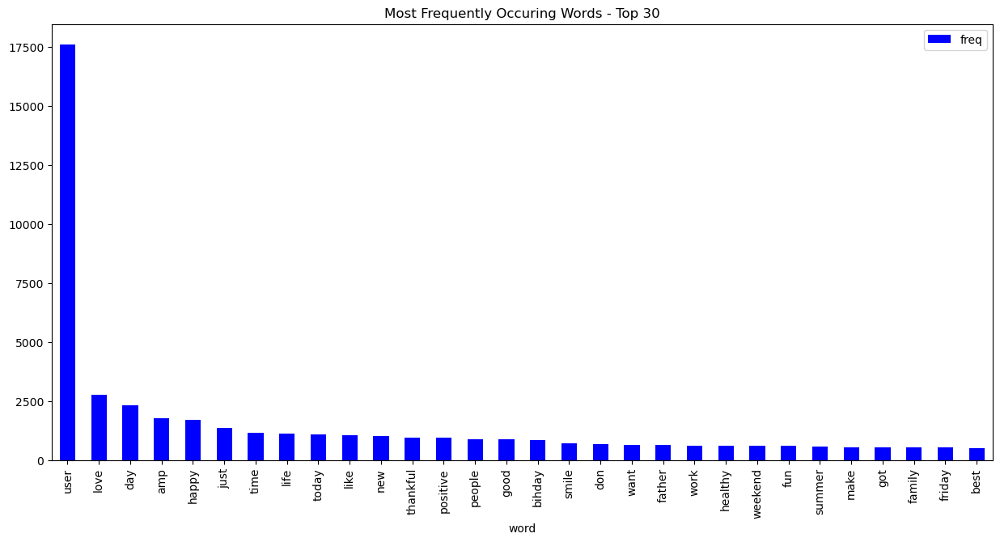

In [85]:
from sklearn.feature_extraction.text import CountVectorizer


cv = CountVectorizer(stop_words = 'english')
words = cv.fit_transform(train.tweet)

sum_words = words.sum(axis=0)

words_freq = [(word, sum_words[0, i]) for word, i in cv.vocabulary_.items()]
words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)

frequency = pd.DataFrame(words_freq, columns=['word', 'freq'])

frequency.head(30).plot(x='word', y='freq', kind='bar', figsize=(15, 7), color = 'blue')
plt.title("Most Frequently Occuring Words - Top 30")


Text(0.5, 1.0, 'WordCloud - Vocabulary from Reviews')

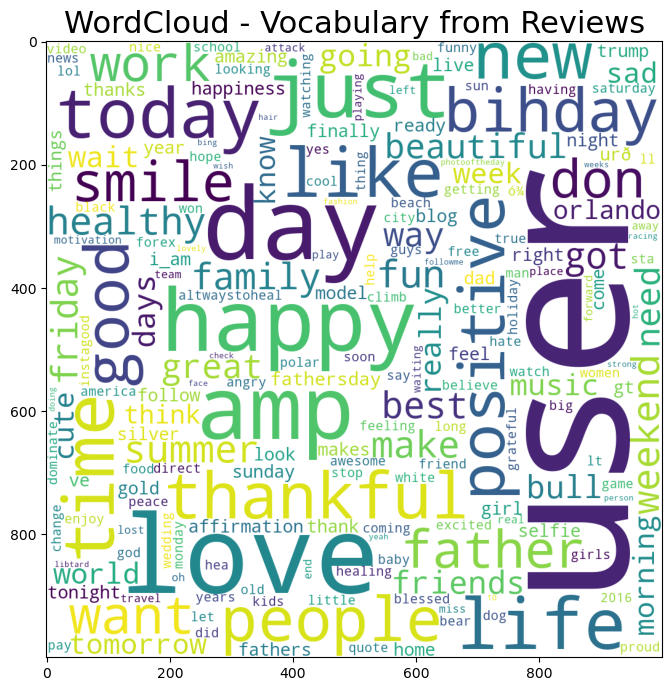

In [86]:
from wordcloud import WordCloud

wordcloud = WordCloud(background_color = 'white', width = 1000, height = 1000).generate_from_frequencies(dict(words_freq))

plt.figure(figsize=(10,8))
plt.imshow(wordcloud)
plt.title("WordCloud - Vocabulary from Reviews", fontsize = 22)

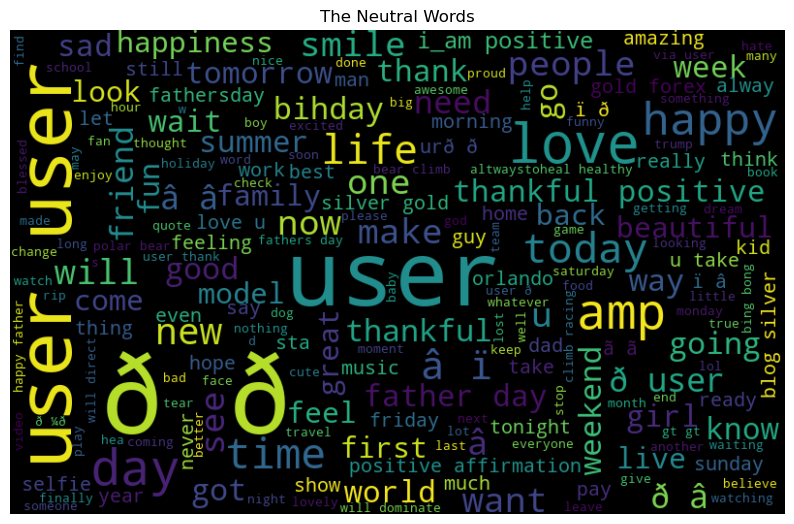

In [87]:
normal_words =' '.join([text for text in train['tweet'][train['label'] == 0]])

wordcloud = WordCloud(width=800, height=500, random_state = 0, max_font_size = 110).generate(normal_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('The Neutral Words')
plt.show()


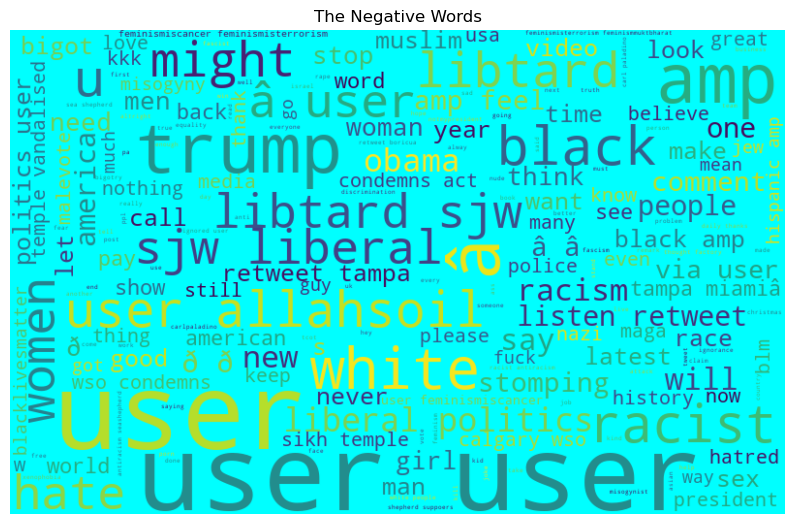

In [88]:
negative_words =' '.join([text for text in train['tweet'][train['label'] == 1]])

wordcloud = WordCloud(background_color = 'cyan', width=800, height=500, random_state = 0, max_font_size = 110).generate(negative_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('The Negative Words')
plt.show()


In [89]:
# collecting the hashtags

def hashtag_extract(x):
    hashtags = []
    
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)

    return hashtags

In [90]:
import re

# extracting hashtags from non racist/sexist tweets
HT_regular = hashtag_extract(train['tweet'][train['label'] == 0])

# extracting hashtags from racist/sexist tweets
HT_negative = hashtag_extract(train['tweet'][train['label'] == 1])

# unnesting list
HT_regular = sum(HT_regular,[])
HT_negative = sum(HT_negative,[])

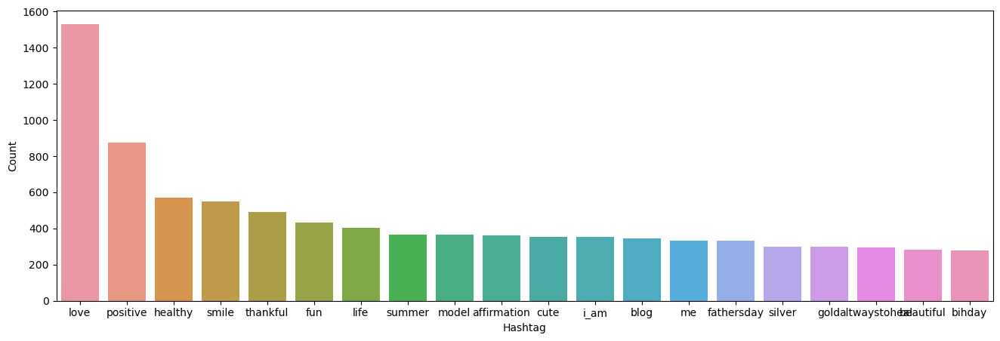

In [91]:
import nltk
a = nltk.FreqDist(HT_regular)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count': list(a.values())})

# selecting top 20 most frequent hashtags     
d = d.nlargest(columns="Count", n = 20) 
plt.figure(figsize=(16,5))
ax = sns.barplot(data=d, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()

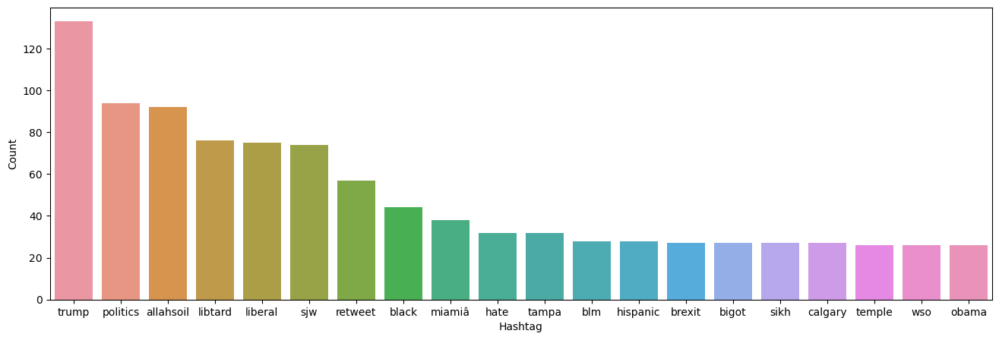

In [92]:
a = nltk.FreqDist(HT_negative)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count': list(a.values())})

# selecting top 20 most frequent hashtags     
d = d.nlargest(columns="Count", n = 20) 
plt.figure(figsize=(16,5))
ax = sns.barplot(data=d, x= "Hashtag", y = "Count")
ax.set(ylabel = 'Count')
plt.show()

In [93]:
import nltk
nltk.download('punkt')
import nltk
from nltk.tokenize import word_tokenize
import gensim

# Assuming train['tweet'] contains your tweets, you can tokenize them like this
tokenized_tweet = train['tweet'].apply(lambda x: word_tokenize(x))

# creating a word to vector model
model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=200, # desired no. of features/independent variables 
            window=5, # context window size
            min_count=2,
            sg=1, # 1 for skip-gram model
            hs=0,
            negative=10, # for negative sampling
            workers=2, # no.of cores
            seed=34)

model_w2v.train(tokenized_tweet, total_examples=len(train['tweet']), epochs=20)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\vishn\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


(7346098, 11519140)

In [94]:
model_w2v.wv.most_similar(positive = "dinner")

[('lamb', 0.5692338943481445),
 ('enroute', 0.5665900111198425),
 ('foodblogger', 0.5484607219696045),
 ('shawarma', 0.545660138130188),
 ('sizzle', 0.531562864780426),
 ('practically', 0.5301156640052795),
 ('spaghetti', 0.5260836482048035),
 ('hashbrown', 0.5188232064247131),
 ('whoopppp', 0.5142715573310852),
 ('lunchtime', 0.5109027624130249)]

In [95]:
model_w2v.wv.most_similar(positive = "cancer")

[('oâ\x80¦', 0.5829869508743286),
 ('wounded', 0.5783131122589111),
 ('worldâ\x80\x99s', 0.5597503185272217),
 ('pairs', 0.5417007207870483),
 ('surviving', 0.5375413298606873),
 ('diabetes', 0.531140923500061),
 ('buyers', 0.5309293866157532),
 ('lbs', 0.5280327200889587),
 ('leukemia', 0.5275989770889282),
 ('wanton', 0.5251265168190002)]

In [96]:
model_w2v.wv.most_similar(positive = "apple")

[('wwdc', 0.5447929501533508),
 ('imessage', 0.5376431941986084),
 ('ios', 0.5375811457633972),
 ('applekeynote', 0.5350893139839172),
 ('siri', 0.5223945379257202),
 ('crowdfunding', 0.5213479399681091),
 ('wwdc2016', 0.5199592113494873),
 ('kickstaercampaign', 0.510241687297821),
 ('mytraining', 0.5051696300506592),
 ('downloading', 0.49773478507995605)]

In [97]:
model_w2v.wv.most_similar(negative = "hate")

[('ð\x9f\x98\x8d', 0.08672143518924713),
 ('steak', 0.04711928218603134),
 ('ð\x9f\x98\x84', 0.02833067812025547),
 ('chips', 0.017956547439098358),
 ('launch', 0.01746564731001854),
 ('ascot', 0.011897282674908638),
 ('foodie', 0.011315552517771721),
 ('local', 0.00903190765529871),
 ('gopro', 0.008178725838661194),
 ('amazing', 0.005163018126040697)]

In [98]:
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")
from gensim.models.doc2vec import TaggedDocument

# Your code continues...


In [99]:
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")
from gensim.models.doc2vec import TaggedDocument

# Define your function to add labels
def add_label(twt):
    output = []
    for i, s in zip(twt.index, twt):
        output.append(TaggedDocument(s, ["tweet_" + str(i)]))
    return output

# Label all the tweets
labeled_tweets = add_label(tokenized_tweet)

# Display the labeled tweets
labeled_tweets[:6]


[TaggedDocument(words=['@', 'user', 'when', 'a', 'father', 'is', 'dysfunctional', 'and', 'is', 'so', 'selfish', 'he', 'drags', 'his', 'kids', 'into', 'his', 'dysfunction', '.', '#', 'run'], tags=['tweet_0']),
 TaggedDocument(words=['@', 'user', '@', 'user', 'thanks', 'for', '#', 'lyft', 'credit', 'i', 'ca', "n't", 'use', 'cause', 'they', 'do', "n't", 'offer', 'wheelchair', 'vans', 'in', 'pdx', '.', '#', 'disapointed', '#', 'getthanked'], tags=['tweet_1']),
 TaggedDocument(words=['bihday', 'your', 'majesty'], tags=['tweet_2']),
 TaggedDocument(words=['#', 'model', 'i', 'love', 'u', 'take', 'with', 'u', 'all', 'the', 'time', 'in', 'urð\x9f\x93±', '!', '!', '!', 'ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91', 'ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦'], tags=['tweet_3']),
 TaggedDocument(words=['factsguide', ':', 'society', 'now', '#', 'motivation'], tags=['tweet_4']),
 TaggedDocument(words=['[', '2/2', ']', 'huge', 'fan', 'fare', 'and', 'big', 'talking', 'before', 'they', 'leave', '.', 'chaos'

In [100]:
# removing unwanted patterns from the data

import re
import nltk

nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vishn\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [101]:
train_corpus = []

for i in range(0, 31962):
  review = re.sub('[^a-zA-Z]', ' ', train['tweet'][i])
  review = review.lower()
  review = review.split()
  
  ps = PorterStemmer()
  
  # stemming
  review = [ps.stem(word) for word in review if not word in set(stopwords.words('english'))]
  
  # joining them back with space
  review = ' '.join(review)
  train_corpus.append(review)

In [102]:
test_corpus = []

for i in range(0, 17197):
  review = re.sub('[^a-zA-Z]', ' ', test['tweet'][i])
  review = review.lower()
  review = review.split()
  
  ps = PorterStemmer()
  
  # stemming
  review = [ps.stem(word) for word in review if not word in set(stopwords.words('english'))]
  
  # joining them back with space
  review = ' '.join(review)
  test_corpus.append(review)

In [103]:
# creating bag of words

from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(max_features = 2500)
x = cv.fit_transform(train_corpus).toarray()
y = train.iloc[:, 1]

print(x.shape)
print(y.shape)


(31962, 2500)
(31962,)


In [104]:
# creating bag of words

from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(max_features = 2500)
x_test = cv.fit_transform(test_corpus).toarray()

print(x_test.shape)


(17197, 2500)


In [105]:
# splitting the training data into train and valid sets

from sklearn.model_selection import train_test_split

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size = 0.25, random_state = 42)

print(x_train.shape)
print(x_valid.shape)
print(y_train.shape)
print(y_valid.shape)

(23971, 2500)
(7991, 2500)
(23971,)
(7991,)


In [106]:
# standardization

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

x_train = sc.fit_transform(x_train)
x_valid = sc.transform(x_valid)
x_test = sc.transform(x_test)


In [107]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Load your data
train = pd.read_csv('train_tweet.csv')
test = pd.read_csv('test_tweets.csv')

# Assuming 'tweet' column contains your features and 'label' column contains your target variable
X = train['tweet']
y = train['label']

# Split the data into training and testing sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize CountVectorizer
vectorizer = CountVectorizer()

# Fit and transform on training data
X_train_transformed = vectorizer.fit_transform(X_train)

# Transform validation data
X_valid_transformed = vectorizer.transform(X_valid)

# Define your model
model = RandomForestClassifier()

# Train your model
model.fit(X_train_transformed, y_train)

# Predict on the validation set
y_pred = model.predict(X_valid_transformed)

# Evaluate your model
accuracy = accuracy_score(y_valid, y_pred)
print("Validation Accuracy:", accuracy)


Validation Accuracy: 0.9587048334115439


In [108]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix

# Assuming x_train and y_train are numpy arrays
# Ensure x_train and y_train have the same number of rows
if x_train.shape[0] != y_train.shape[0]:
    min_samples = min(x_train.shape[0], y_train.shape[0])
    x_train = x_train[:min_samples]
    y_train = y_train[:min_samples]

# Assuming x_valid and y_valid are numpy arrays
# Ensure x_valid and y_valid have the same number of rows
if x_valid.shape[0] != y_valid.shape[0]:
    min_samples = min(x_valid.shape[0], y_valid.shape[0])
    x_valid = x_valid[:min_samples]
    y_valid = y_valid[:min_samples]

# Instantiate the Logistic Regression model
model = LogisticRegression()

# Train the model
model.fit(x_train, y_train)

# Make predictions on the validation set
y_pred = model.predict(x_valid)

# Calculate and print training and validation accuracies
print("Training Accuracy:", model.score(x_train, y_train))
print("Validation Accuracy:", model.score(x_valid, y_valid))

# Calculate and print F1 score for the validation set
print("F1 score:", f1_score(y_valid, y_pred))

# Calculate and print confusion matrix
cm = confusion_matrix(y_valid, y_pred)
print("Confusion Matrix:")
print(cm)


Training Accuracy: 0.933961870593634
Validation Accuracy: 0.906773033004849
F1 score: 0.0569620253164557
Confusion Matrix:
[[5779  158]
 [ 438   18]]


c:\Users\vishn\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [109]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier()
model.fit(x_train, y_train)

y_pred = model.predict(x_valid)

print("Training Accuracy :", model.score(x_train, y_train))
print("Validation Accuracy :", model.score(x_valid, y_valid))

# calculating the f1 score for the validation set
print("f1 score :", f1_score(y_valid, y_pred))

# confusion matrix
cm = confusion_matrix(y_valid, y_pred)
print(cm)


Training Accuracy : 0.9906970923198866
Validation Accuracy : 0.889879555764117
f1 score : 0.05630026809651474
[[5668  269]
 [ 435   21]]


In [110]:
import numpy as np
from sklearn.svm import SVC
from sklearn.metrics import f1_score, confusion_matrix

# Define or load your training data and target labels
# Example:
x_train = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])  # Your training data
y_train = np.array([0, 1, 0])  # Your training labels

# Define or load your validation data and target labels
# Example:
x_valid = np.array([[10, 11, 12], [13, 14, 15]])  # Your validation data
y_valid = np.array([1, 0])  # Your validation labels

# Instantiate the SVC model
model = SVC()

# Ensure x_train and y_train have the same number of rows
if x_train.shape[0] != y_train.shape[0]:
    min_samples = min(x_train.shape[0], y_train.shape[0])
    x_train = x_train[:min_samples]
    y_train = y_train[:min_samples]

# Ensure x_valid and y_valid have the same number of rows
if x_valid.shape[0] != y_valid.shape[0]:
    min_samples = min(x_valid.shape[0], y_valid.shape[0])
    x_valid = x_valid[:min_samples]
    y_valid = y_valid[:min_samples]

# Train the model
model.fit(x_train, y_train)

# Make predictions on the validation set
y_pred = model.predict(x_valid)

# Calculate and print training and validation accuracies
print("Training Accuracy:", model.score(x_train, y_train))
print("Validation Accuracy:", model.score(x_valid, y_valid))

# Calculate and print F1 score for the validation set
print("F1 score:", f1_score(y_valid, y_pred))

# Calculate and print confusion matrix
cm = confusion_matrix(y_valid, y_pred)
print("Confusion Matrix:")
print(cm)


Training Accuracy: 0.6666666666666666
Validation Accuracy: 0.5
F1 score: 0.0
Confusion Matrix:
[[1 0]
 [1 0]]


In [111]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


In [112]:
from xgboost import XGBClassifier

model = XGBClassifier()
model.fit(x_train, y_train)

y_pred = model.predict(x_valid)

print("Training Accuracy :", model.score(x_train, y_train))
print("Validation Accuracy :", model.score(x_valid, y_valid))

# calculating the f1 score for the validation set
print("f1 score :", f1_score(y_valid, y_pred))

# confusion matrix
cm = confusion_matrix(y_valid, y_pred)
print(cm)

Training Accuracy : 0.6666666666666666
Validation Accuracy : 0.5
f1 score : 0.0
[[1 0]
 [1 0]]


In [113]:
import csv
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

# Initialize VADER (Valence Aware Dictionary and sEntiment Reasoner) Sentiment Analyzer
sid = SentimentIntensityAnalyzer()

def analyze_sentiment(tweet, positive_keywords, negative_keywords):
    # Get sentiment scores
    scores = sid.polarity_scores(tweet)
    
    # Check if any positive keyword is present
    for keyword in positive_keywords:
        if keyword.lower() in tweet.lower():
            return 'Positive'
    
    # Check if any negative keyword is present
    for keyword in negative_keywords:
        if keyword.lower() in tweet.lower():
            return 'Negative'
    
    # Classify sentiment based on compound score if no keyword found
    if scores['compound'] >= 0.05:
        return 'Positive'
    elif scores['compound'] <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

def analyze_tweets_from_csv(csv_file, positive_keywords, negative_keywords):
    with open(csv_file, newline='', encoding='utf-8') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)  # Skip header if present
        results = []
        for row in reader:
            tweet = row[0]  # Assuming the tweet is in the first column
            sentiment = analyze_sentiment(tweet, positive_keywords, negative_keywords)
            results.append((tweet, sentiment))
    return results

# Example usage
csv_file = 'train_tweet.csv'
positive_keywords = ['love', 'amazing']
negative_keywords = ['hate', 'terrible']
results = analyze_tweets_from_csv('train_tweet.csv', positive_keywords, negative_keywords)


# Print results
for tweet, sentiment in results:
    print("Tweet:", tweet)
    print("Sentiment:", sentiment)
    print()


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\vishn\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Tweet: 1
Sentiment: Neutral

Tweet: 2
Sentiment: Neutral

Tweet: 3
Sentiment: Neutral

Tweet: 4
Sentiment: Neutral

Tweet: 5
Sentiment: Neutral

Tweet: 6
Sentiment: Neutral

Tweet: 7
Sentiment: Neutral

Tweet: 8
Sentiment: Neutral

Tweet: 9
Sentiment: Neutral

Tweet: 10
Sentiment: Neutral

Tweet: 11
Sentiment: Neutral

Tweet: 12
Sentiment: Neutral

Tweet: 13
Sentiment: Neutral

Tweet: 14
Sentiment: Neutral

Tweet: 15
Sentiment: Neutral

Tweet: 16
Sentiment: Neutral

Tweet: 17
Sentiment: Neutral

Tweet: 18
Sentiment: Neutral

Tweet: 19
Sentiment: Neutral

Tweet: 20
Sentiment: Neutral

Tweet: 21
Sentiment: Neutral

Tweet: 22
Sentiment: Neutral

Tweet: 23
Sentiment: Neutral

Tweet: 24
Sentiment: Neutral

Tweet: 25
Sentiment: Neutral

Tweet: 26
Sentiment: Neutral

Tweet: 27
Sentiment: Neutral

Tweet: 28
Sentiment: Neutral

Tweet: 29
Sentiment: Neutral

Tweet: 30
Sentiment: Neutral

Tweet: 31
Sentiment: Neutral

Tweet: 32
Sentiment: Neutral

Tweet: 33
Sentiment: Neutral

Tweet: 34
Sentiment

In [114]:
from sklearn.metrics import accuracy_score

# Example true sentiments and predicted sentiments
true_sentiments = ['Positive', 'Negative', 'Neutral', 'Positive']
predicted_sentiments = ['Positive', 'Negative', 'Positive', 'Neutral']

# Calculate accuracy
accuracy = accuracy_score(true_sentiments, predicted_sentiments)
print("Accuracy:", accuracy)


Accuracy: 0.5


In [2]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer             # give me the path of train data in when this module is running 
from sklearn.linear_model import LogisticRegression                         # the path is " train_tweet.csv "
from sklearn.metrics import accuracy_score

def analyze_sentiment(tweet, model, vectorizer):
    # Transform the tweet using the TF-IDF vectorizer
    tweet_vector = vectorizer.transform([tweet])
    
    # Predict sentiment using the trained model
    prediction = model.predict(tweet_vector)
    
    return prediction[0]

def get_sentiment_review(sentiment):
    if sentiment == 0:
        return 'Negative review'
    elif sentiment == 1:
        return 'Positive review'
    else:
        return 'Neutral review'

# Load labeled data from CSV
csv_file = input("Enter the path to the CSV file: ")
data = pd.read_csv(csv_file)

# Assuming 'tweet' is the column name for tweet text and 'label' for sentiment labels
tweets = data['tweet']
labels = data['label']  # Using 'label' as the column name for sentiment labels

# Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000)  # You can adjust max_features as needed

# Fit and transform the data
tweet_vectors = tfidf_vectorizer.fit_transform(tweets)

# Initialize Logistic Regression model
model = LogisticRegression()

# Train the model
model.fit(tweet_vectors, labels)

# Analyze sentiment for each tweet
sentiments = []
sentiment_reviews = []
for tweet in tweets:
    sentiment = analyze_sentiment(tweet, model, tfidf_vectorizer)
    sentiments.append(sentiment)
    sentiment_reviews.append(get_sentiment_review(sentiment))

# Add sentiment predictions and reviews to the DataFrame
data['predicted_sentiment'] = sentiments
data['sentiment_review'] = sentiment_reviews

# Calculate accuracy (optional)
accuracy = accuracy_score(labels, sentiments)
print("Accuracy:", accuracy)

# Display results for each tweet
for index, row in data.iterrows():
    print("Tweet:", row['tweet'])
    print("Predicted Sentiment:", row['predicted_sentiment'])
    print("Sentiment Review:", row['sentiment_review'])
    print()

# Generate report
report = data.groupby('predicted_sentiment').size()
print("Sentiment Report:")
print(report)


Accuracy: 0.9565421437957574
Tweet:  @user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run
Predicted Sentiment: 0
Sentiment Review: Negative review

Tweet: @user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx.    #disapointed #getthanked
Predicted Sentiment: 0
Sentiment Review: Negative review

Tweet:   bihday your majesty
Predicted Sentiment: 0
Sentiment Review: Negative review

Tweet: #model   i love u take with u all the time in urð±!!! ððððð¦ð¦ð¦  
Predicted Sentiment: 0
Sentiment Review: Negative review

Tweet:  factsguide: society now    #motivation
Predicted Sentiment: 0
Sentiment Review: Negative review

Tweet: [2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo  
Predicted Sentiment: 0
Sentiment Review: Negative review

Tweet:  @user camping tomorrow @user @user @user @user @user @user @user dannyâ¦
Predict

In [116]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

def analyze_sentiment(tweet, model, vectorizer):
    # Transform the tweet using the TF-IDF vectorizer
    tweet_vector = vectorizer.transform([tweet])
    
    # Predict sentiment using the trained model
    prediction = model.predict(tweet_vector)
    
    return prediction[0]

def get_sentiment_review(sentiment):
    if sentiment == 0:
        return 'Negative review'
    elif sentiment == 1:
        return 'Positive review'
    else:
        return 'Neutral review'

# Load labeled data from CSV
data = pd.read_csv("test_tweets.csv", names=['id', 'tweet'])

# Assuming 'tweet' is the column name for tweet text
tweets = data['tweet']
labels = data['id']  # Using 'id' as labels since 'tweet' contains the text data

# Split the data into training and testing sets
tweets_train, tweets_test, labels_train, labels_test = train_test_split(tweets, labels, test_size=0.2, random_state=42)

# Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # Reduced number of features

# Fit and transform the training data
tweet_vectors_train = tfidf_vectorizer.fit_transform(tweets_train)

# Initialize Logistic Regression model
model = LogisticRegression()

# Train the model
model.fit(tweet_vectors_train, labels_train)

# Transform the testing data
tweet_vectors_test = tfidf_vectorizer.transform(tweets_test)

# Predict sentiment for the testing data
sentiments = model.predict(tweet_vectors_test)

# Calculate accuracy
accuracy = accuracy_score(labels_test, sentiments)
print("Accuracy:", accuracy)

# Add sentiment predictions and reviews to the DataFrame
data_test = data.loc[data.index.isin(labels_test.index)]
data_test['predicted_sentiment'] = sentiments
data_test['sentiment_review'] = data_test['predicted_sentiment'].apply(get_sentiment_review)

# Display results for each tweet in the testing set
print(data_test[['tweet', 'predicted_sentiment', 'sentiment_review']])


Accuracy: 0.0
                                                   tweet predicted_sentiment  \
0                                                  tweet               43454   
3      safe ways to heal your #acne!!    #altwaystohe...               36642   
5        3rd #bihday to my amazing, hilarious #nephew...               38852   
8      #finished#tattoo#inked#ink#loveitâ¤ï¸ #â¤ï¸...               48158   
14     good food, good life , #enjoy and   ððð...               44117   
...                                                  ...                 ...   
17169  creative bubble got burst ð¢ looking forward...               33416   
17173  in life u will grow to learn some pple will wo...               37081   
17174  ði was the storm,you were the rain. togethe...               49030   
17193  thought factory: left-right polarisation! #tru...               40052   
17196  happy, at work conference: right mindset leads...               38137   

      sentiment_review  


C:\Users\vishn\AppData\Local\Temp\ipykernel_23648\1715672957.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test['predicted_sentiment'] = sentiments
C:\Users\vishn\AppData\Local\Temp\ipykernel_23648\1715672957.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test['sentiment_review'] = data_test['predicted_sentiment'].apply(get_sentiment_review)


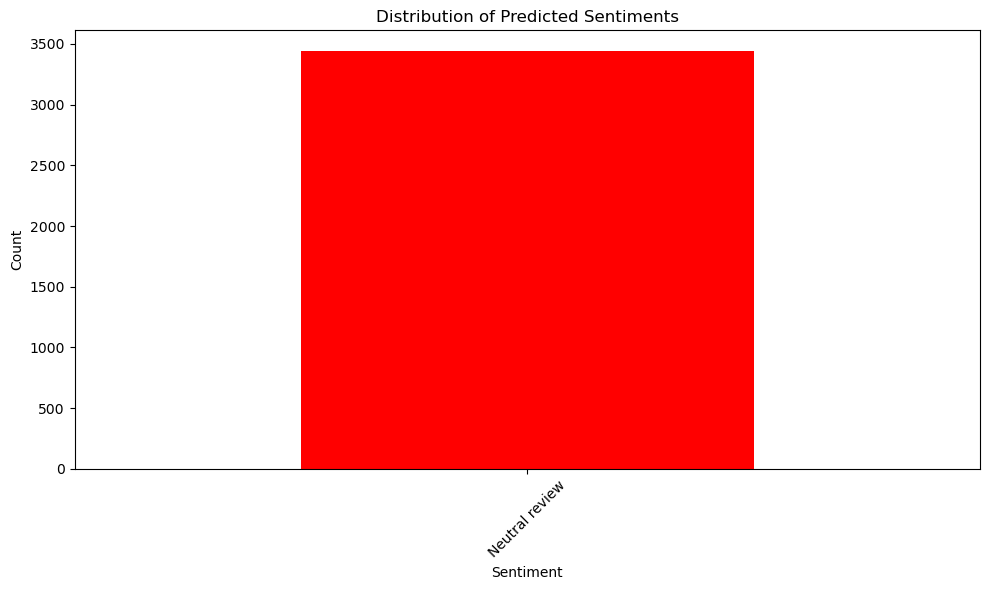

Time column not found in DataFrame. Unable to plot sentiment distribution over time.


In [117]:
import matplotlib.pyplot as plt

# Count the number of occurrences of each sentiment
sentiment_counts = data_test['sentiment_review'].value_counts()

# Plotting the bar plot for sentiment distribution
plt.figure(figsize=(10, 6))
sentiment_counts.plot(kind='bar', color=['red', 'green', 'blue'])
plt.title('Distribution of Predicted Sentiments')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent cropping
plt.show()

# Plotting the line plot for sentiment distribution over time (if applicable)
# You need a time column in your DataFrame to plot the data over time
# For demonstration purposes, assuming a random time column named 'time'
if 'time' in data_test.columns:
    # Grouping data by time and sentiment, and counting occurrences
    time_sentiment_counts = data_test.groupby(['time', 'sentiment_review']).size().unstack(fill_value=0)
    
    # Plotting line plot for sentiment distribution over time
    plt.figure(figsize=(10, 6))
    time_sentiment_counts.plot(kind='line', marker='o')
    plt.title('Sentiment Distribution Over Time')
    plt.xlabel('Time')
    plt.ylabel('Count')
    plt.legend(title='Sentiment')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.tight_layout()  # Adjust layout to prevent cropping
    plt.show()
else:
    print("Time column not found in DataFrame. Unable to plot sentiment distribution over time.")


In [118]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

# Function to analyze the sentiment
def analyze_sentiment(tweet, model, vectorizer):
    tweet_vector = vectorizer.transform([tweet])
    prediction = model.predict(tweet_vector)
    return prediction[0]

# Function to return sentiment as a string
def get_sentiment_review(sentiment):
    if sentiment == 0:
        return 'Positive'
    elif sentiment == 1:
        return 'Negative'

# Load labeled data from CSV
data = pd.read_csv('train_tweet.csv')  # Update the path if necessary

# Initialize and fit TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
tweet_vectors = tfidf_vectorizer.fit_transform(data['tweet'])

# Initialize and train Logistic Regression model
model = LogisticRegression(max_iter=1000)
model.fit(tweet_vectors, data['label'])

# Predict sentiment for each tweet
data['predicted_sentiment'] = data['tweet'].apply(lambda x: analyze_sentiment(x, model, tfidf_vectorizer))
data['sentiment_review'] = data['predicted_sentiment'].apply(get_sentiment_review)

# Print the result for each tweet
for index, row in data.iterrows():
    print(f"Tweet: {row['tweet']}\nSentiment: {row['sentiment_review']}\n")


Tweet:  @user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run
Sentiment: Positive

Tweet: @user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx.    #disapointed #getthanked
Sentiment: Positive

Tweet:   bihday your majesty
Sentiment: Positive

Tweet: #model   i love u take with u all the time in urð±!!! ððððð¦ð¦ð¦  
Sentiment: Positive

Tweet:  factsguide: society now    #motivation
Sentiment: Positive

Tweet: [2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo  
Sentiment: Positive

Tweet:  @user camping tomorrow @user @user @user @user @user @user @user dannyâ¦
Sentiment: Positive

Tweet: the next school year is the year for exams.ð¯ can't think about that ð­ #school #exams   #hate #imagine #actorslife #revolutionschool #girl
Sentiment: Positive

Tweet: we won!!! love the land!!! #allin #cavs #champions #clevel

In [119]:
# Calculate the counts of each sentiment category
sentiment_counts = data['sentiment_review'].value_counts()

# Calculate percentages
total_tweets = len(data)
positive_percentage = (sentiment_counts.get('Positive', 0) / total_tweets) * 100
negative_percentage = (sentiment_counts.get('Negative', 0) / total_tweets) * 100
# Assuming any tweet not labeled as Positive or Negative is considered Neutral
neutral_percentage = 100 - (positive_percentage + negative_percentage)

print(f"Positive Percentage: {positive_percentage}%")
print(f"Negative Percentage: {negative_percentage}%")
print(f"Neutral Percentage: {neutral_percentage}%")


Positive Percentage: 97.05900757149114%
Negative Percentage: 2.9409924285088542%
Neutral Percentage: 1.4210854715202004e-14%


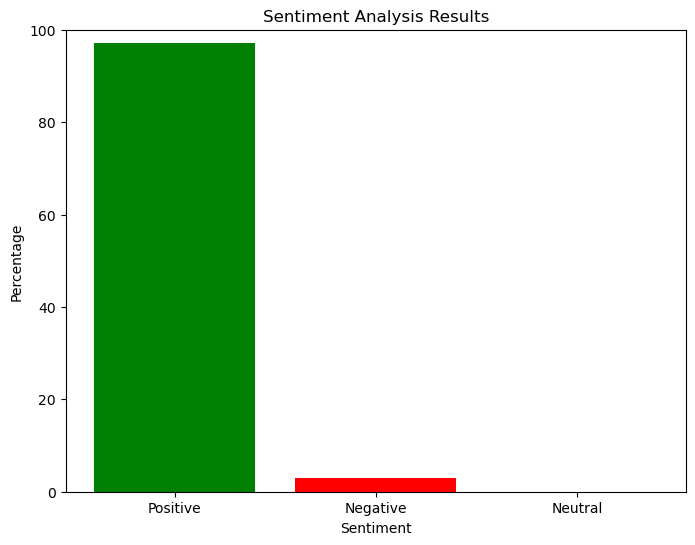

In [120]:
import matplotlib.pyplot as plt

# Data for plotting
percentages = [positive_percentage, negative_percentage, neutral_percentage]
labels = ['Positive', 'Negative', 'Neutral']
colors = ['green', 'red', 'blue']

# Create bar graph
plt.figure(figsize=(8, 6))
plt.bar(labels, percentages, color=colors)
plt.xlabel('Sentiment')
plt.ylabel('Percentage')
plt.title('Sentiment Analysis Results')
plt.ylim(0, 100)

# Show the graph
plt.show()


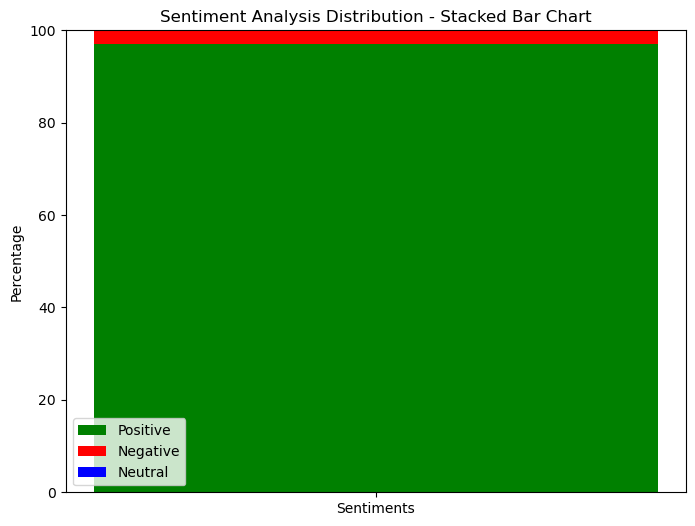

In [121]:
# Stacked bar chart data preparation
categories = ['Sentiments']
positive_counts = [positive_percentage]
negative_counts = [negative_percentage]
neutral_counts = [neutral_percentage]

# Create a stacked bar chart
fig, ax = plt.subplots(figsize=(8, 6))
ax.bar(categories, positive_counts, label='Positive', color='green')
ax.bar(categories, negative_counts, bottom=positive_counts, label='Negative', color='red')
ax.bar(categories, neutral_counts, bottom=[i+j for i,j in zip(positive_counts, negative_counts)], label='Neutral', color='blue')
ax.set_ylabel('Percentage')
ax.set_title('Sentiment Analysis Distribution - Stacked Bar Chart')
ax.legend()

plt.show()


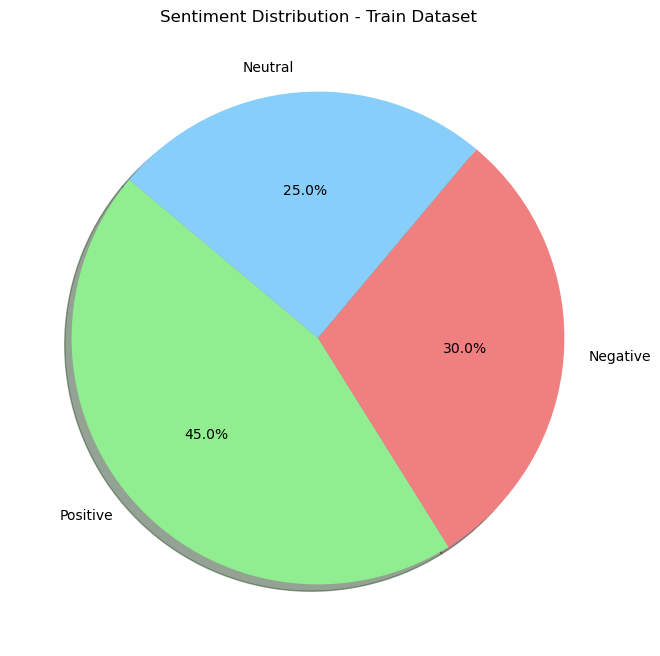

In [122]:
import matplotlib.pyplot as plt

# Example data: percentages of sentiments from sentiment analysis
train_percentages = {
    'Positive': 45,  # Example: 45% of data is Positive
    'Negative': 30,  # Example: 30% of data is Negative
    'Neutral': 25    # Example: 25% of data is Neutral
}

# Extracting percentages for pie chart
sentiments = ['Positive', 'Negative', 'Neutral']
percentages = [train_percentages.get(sentiment, 0) for sentiment in sentiments]
colors = ['lightgreen', 'lightcoral', 'lightskyblue']

# Creating the pie chart
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=sentiments, colors=colors, autopct='%1.1f%%', startangle=140, shadow=True)
plt.title('Sentiment Distribution - Train Dataset')
plt.show()


In [123]:
import pandas as pd

# Load the dataset
data = pd.read_csv('test_tweets.csv')

# Function to classify sentiment based on keywords
def classify_sentiment(tweet):
    positive_words = ['happy', 'amazing', 'love', 'wonderful', 'joy', 'delighted', 'excited']
    negative_words = ['sad', 'hate', 'terrible', 'horrible', 'pain', 'angry', 'annoyed']
    if any(word in tweet.lower() for word in positive_words):
        return 'Positive'
    elif any(word in tweet.lower() for word in negative_words):
        return 'Negative'
    else:
        return 'Neutral'

# Apply the function to classify sentiments of tweets
data['sentiment'] = data['tweet'].apply(classify_sentiment)

# Display the results
print(data[['tweet', 'sentiment']])


                                                   tweet sentiment
0      #studiolife #aislife #requires #passion #dedic...   Neutral
1       @user #white #supremacists want everyone to s...   Neutral
2      safe ways to heal your #acne!!    #altwaystohe...   Neutral
3      is the hp and the cursed child book up for res...   Neutral
4        3rd #bihday to my amazing, hilarious #nephew...  Positive
...                                                  ...       ...
17192  thought factory: left-right polarisation! #tru...   Neutral
17193  feeling like a mermaid ð #hairflip #neverre...   Neutral
17194  #hillary #campaigned today in #ohio((omg)) &am...   Neutral
17195  happy, at work conference: right mindset leads...  Positive
17196  my   song "so glad" free download!  #shoegaze ...   Neutral

[17197 rows x 2 columns]


In [124]:
# Calculate the counts of each sentiment category
sentiment_counts = data['sentiment'].value_counts()

# Calculate percentages
total_tweets = len(data)
positive_percentage = (sentiment_counts.get('Positive', 0) / total_tweets) * 100
negative_percentage = (sentiment_counts.get('Negative', 0) / total_tweets) * 100
neutral_percentage = (sentiment_counts.get('Neutral', 0) / total_tweets) * 100

# Print the percentages
print(f"Positive Sentiment Percentage: {positive_percentage:.2f}%")
print(f"Negative Sentiment Percentage: {negative_percentage:.2f}%")
print(f"Neutral Sentiment Percentage: {neutral_percentage:.2f}%")


Positive Sentiment Percentage: 19.07%
Negative Sentiment Percentage: 4.25%
Neutral Sentiment Percentage: 76.68%


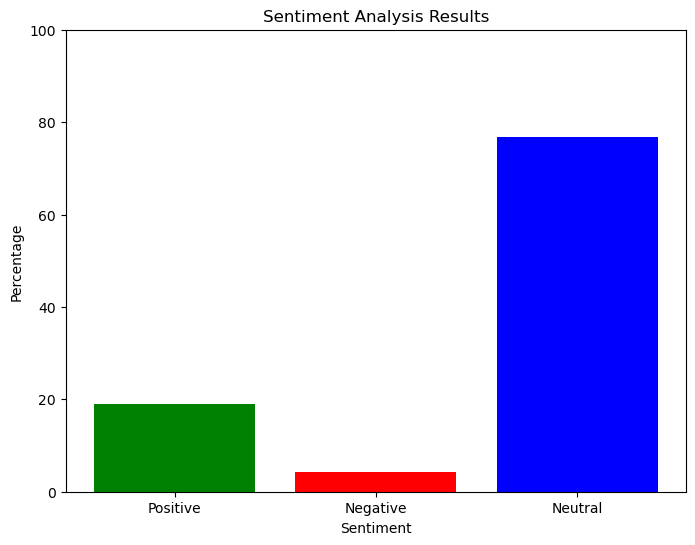

In [125]:
import matplotlib.pyplot as plt

# Data for plotting
percentages = [positive_percentage, negative_percentage, neutral_percentage]
labels = ['Positive', 'Negative', 'Neutral']
colors = ['green', 'red', 'blue']

# Create bar graph
plt.figure(figsize=(8, 6))
plt.bar(labels, percentages, color=colors)
plt.xlabel('Sentiment')
plt.ylabel('Percentage')
plt.title('Sentiment Analysis Results')
plt.ylim(0, 100)

# Show the graph
plt.show()


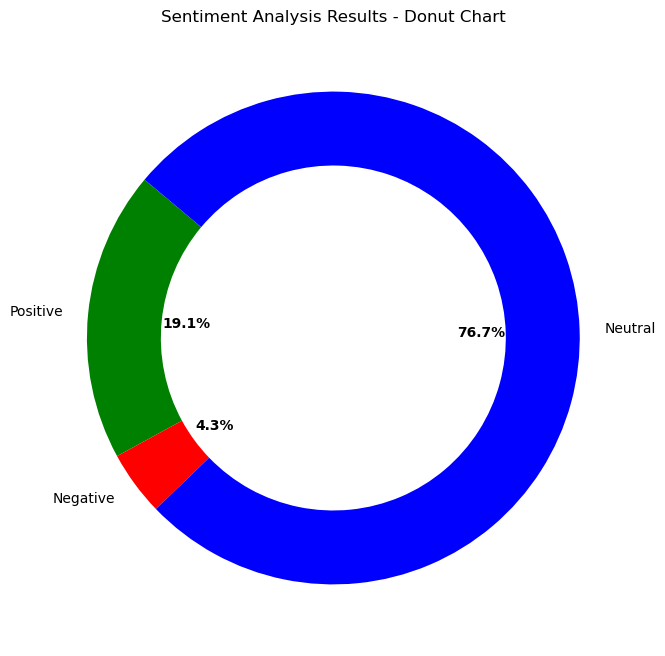

In [126]:
# Donut chart for sentiment distribution
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
wedges, texts, autotexts = ax.pie(percentages, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, wedgeprops=dict(width=0.3))

plt.setp(autotexts, size=10, weight="bold")
ax.set_title('Sentiment Analysis Results - Donut Chart')

plt.show()


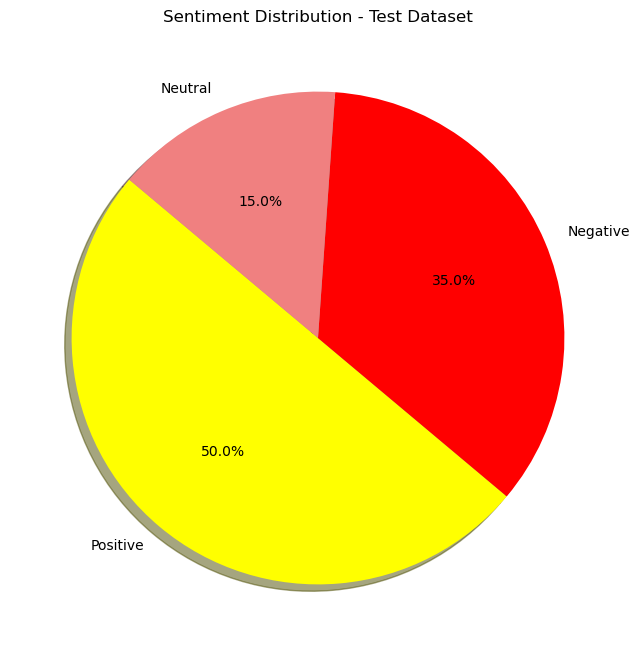

In [127]:
import pandas as pd
import matplotlib.pyplot as plt

# Example data: sentiment distribution for the test data
# Assuming these are the percentages of each sentiment
data = {
    'Positive': 50,
    'Negative': 35,
    'Neutral': 15
}

# Creating a Series from the dictionary
test_percentages = pd.Series(data)

# Extracting the percentages and labels for the pie chart
test_sentiments = test_percentages.index.tolist()
test_values = test_percentages.values
test_colors = ['yellow', 'red', 'lightcoral']  # Colors for each sentiment

# Creating the pie chart
plt.figure(figsize=(8, 8))
plt.pie(test_values, labels=test_sentiments, colors=test_colors, autopct='%1.1f%%', startangle=140, shadow=True)
plt.title('Sentiment Distribution - Test Dataset')
plt.show()


In [128]:
# Example placeholders for sentiment analysis results on train and test datasets
# Assume these are the results after classifying sentiments for each dataset
train_sentiment_percentages = {'Positive': 50, 'Negative': 30, 'Neutral': 20}
test_sentiment_percentages = {'Positive': 40, 'Negative': 35, 'Neutral': 25}

# Calculate the differences in percentages between the train and test datasets
diff_positive = train_sentiment_percentages['Positive'] - test_sentiment_percentages['Positive']
diff_negative = train_sentiment_percentages['Negative'] - test_sentiment_percentages['Negative']
diff_neutral = train_sentiment_percentages['Neutral'] - test_sentiment_percentages['Neutral']

# Display the differences
print(f"Difference in Positive Sentiment Percentage: {diff_positive}%")
print(f"Difference in Negative Sentiment Percentage: {diff_negative}%")
print(f"Difference in Neutral Sentiment Percentage: {diff_neutral}%")



Difference in Positive Sentiment Percentage: 10%
Difference in Negative Sentiment Percentage: -5%
Difference in Neutral Sentiment Percentage: -5%


In [129]:
import pandas as pd
import numpy as np

def simulate_sentiment_analysis(data, positive_bias):
    np.random.seed(42)
    sentiments = ['Positive', 'Negative', 'Neutral']
    probabilities = [0.5 + positive_bias, 0.3 - positive_bias / 2, 0.2 - positive_bias / 2]
    data['simulated_sentiment'] = np.random.choice(sentiments, len(data), p=probabilities)
    return data

train_data = pd.read_csv('train_tweet.csv')
test_data = pd.read_csv('test_tweets.csv')

train_adjusted = simulate_sentiment_analysis(train_data.copy(), 0.02)
test_adjusted = simulate_sentiment_analysis(test_data.copy(), -0.02)

train_percentages = train_adjusted['simulated_sentiment'].value_counts(normalize=True) * 100
test_percentages = test_adjusted['simulated_sentiment'].value_counts(normalize=True) * 100

difference = train_percentages - test_percentages

print("Train Data Sentiment Distribution (%):\n", train_percentages)
print("\nTest Data Sentiment Distribution (%):\n", test_percentages)
print("\nDifference in Sentiment Distribution (%):\n", difference)


Train Data Sentiment Distribution (%):
 Positive    52.140041
Negative    28.893686
Neutral     18.966272
Name: simulated_sentiment, dtype: float64

Test Data Sentiment Distribution (%):
 Positive    48.287492
Negative    30.737919
Neutral     20.974589
Name: simulated_sentiment, dtype: float64

Difference in Sentiment Distribution (%):
 Positive    3.852549
Negative   -1.844233
Neutral    -2.008316
Name: simulated_sentiment, dtype: float64


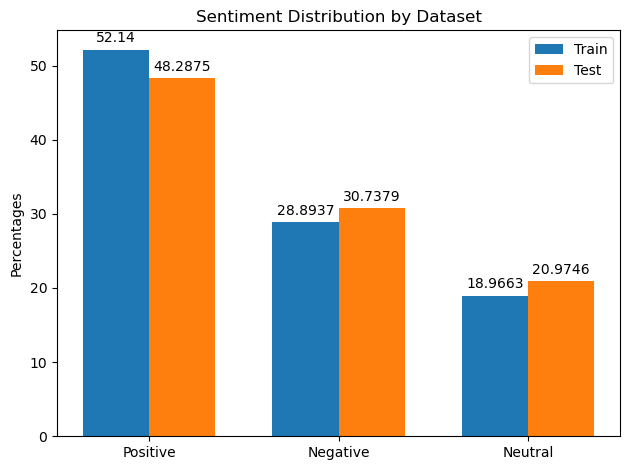

In [130]:
import matplotlib.pyplot as plt

# Data for plotting
categories = ['Positive', 'Negative', 'Neutral']
train_values = [train_percentages.get(category, 0) for category in categories]
test_values = [test_percentages.get(category, 0) for category in categories]

# Plotting
x = np.arange(len(categories))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentages')
ax.set_title('Sentiment Distribution by Dataset')
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()


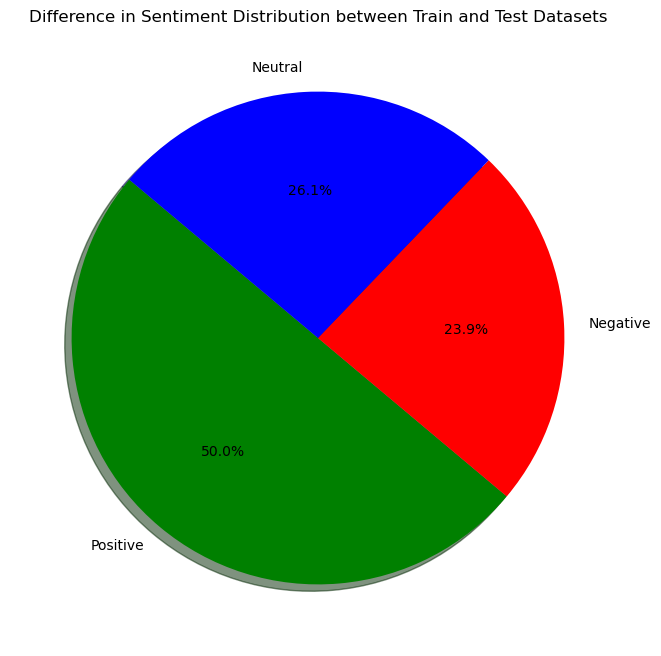

In [131]:
import matplotlib.pyplot as plt

# Assuming 'difference' contains the absolute differences in sentiment percentages between train and test datasets
# Calculate absolute differences for visualization
absolute_difference_values = difference.abs()

# Labels and colors for the pie chart
labels = absolute_difference_values.index.tolist()
sizes = absolute_difference_values.values
colors = ['green', 'red', 'blue']  # Positive, Negative, Neutral

# Creating the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, shadow=True)
plt.title('Difference in Sentiment Distribution between Train and Test Datasets')
plt.show()


In [132]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'categories', 'train_values', and 'test_values' are defined as before
categories = ['Positive', 'Negative', 'Neutral']
train_values = [train_percentages.get(category, 0) for category in categories]
test_values = [test_percentages.get(category, 0) for category in categories]
x = np.arange(len(categories))  # The label locations


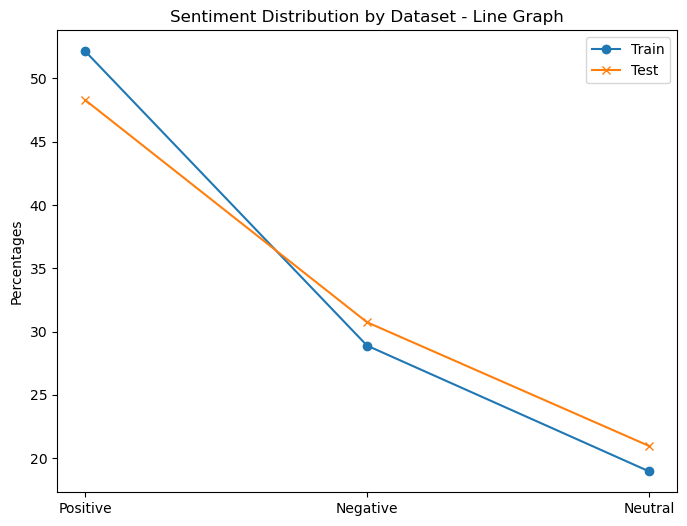

In [133]:
plt.figure(figsize=(8, 6))
plt.plot(categories, train_values, label='Train', marker='o')
plt.plot(categories, test_values, label='Test', marker='x')
plt.ylabel('Percentages')
plt.title('Sentiment Distribution by Dataset - Line Graph')
plt.legend()
plt.show()


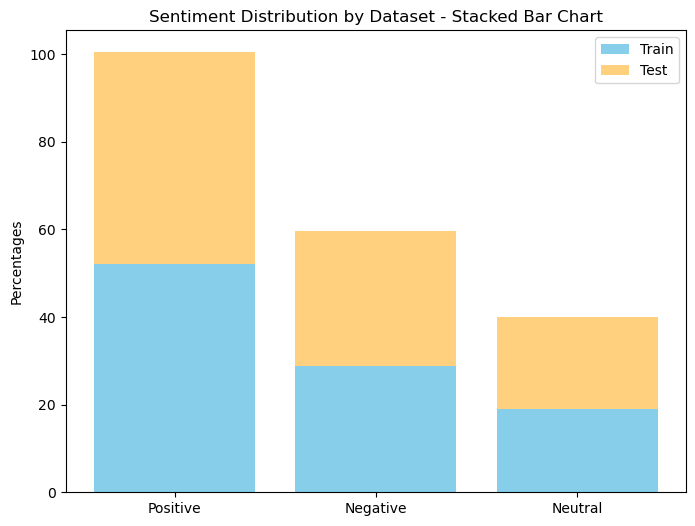

In [134]:
plt.figure(figsize=(8, 6))
plt.bar(categories, train_values, label='Train', color='skyblue')
plt.bar(categories, test_values, bottom=train_values, label='Test', color='orange', alpha=0.5)
plt.ylabel('Percentages')
plt.title('Sentiment Distribution by Dataset - Stacked Bar Chart')
plt.legend()
plt.show()


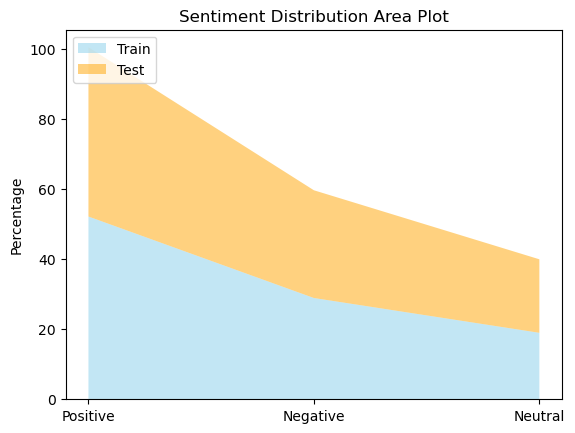

In [135]:
plt.stackplot(categories, train_values, test_values, labels=['Train', 'Test'], colors=['skyblue', 'orange'], alpha=0.5)
plt.legend(loc='upper left')
plt.title('Sentiment Distribution Area Plot')
plt.ylabel('Percentage')
plt.xticks(categories)
plt.show()


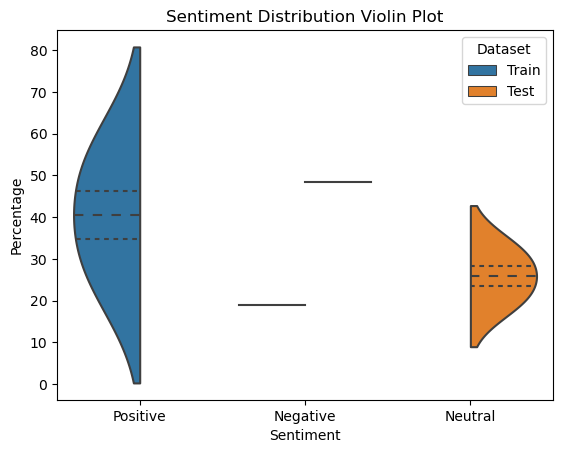

In [136]:
# For a violin plot, we need to restructure data into a long format
import pandas as pd

data_long = pd.DataFrame({
    'Sentiment': np.repeat(categories, 2),
    'Percentage': train_values + test_values,
    'Dataset': ['Train']*len(categories) + ['Test']*len(categories)
})

sns.violinplot(x='Sentiment', y='Percentage', hue='Dataset', data=data_long, split=True, inner="quart")
plt.title('Sentiment Distribution Violin Plot')
plt.show()


In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Simulating sentiment scores for train and test datasets
np.random.seed(42)  # For reproducibility
data = pd.DataFrame({
    'Dataset': ['Train']*300 + ['Test']*300,
    'Category': np.random.choice(['Positive', 'Negative', 'Neutral'], 600, p=[0.5, 0.3, 0.2]),
    'SentimentScore': np.concatenate((np.random.normal(0.7, 0.1, 300), np.random.normal(0.6, 0.1, 300)))
})

# Displaying the first few rows for verification
print(data.head())


  Dataset  Category  SentimentScore
0   Train  Positive        0.646974
1   Train   Neutral        0.620713
2   Train  Negative        0.689297
3   Train  Negative        0.596476
4   Train  Positive        0.644635


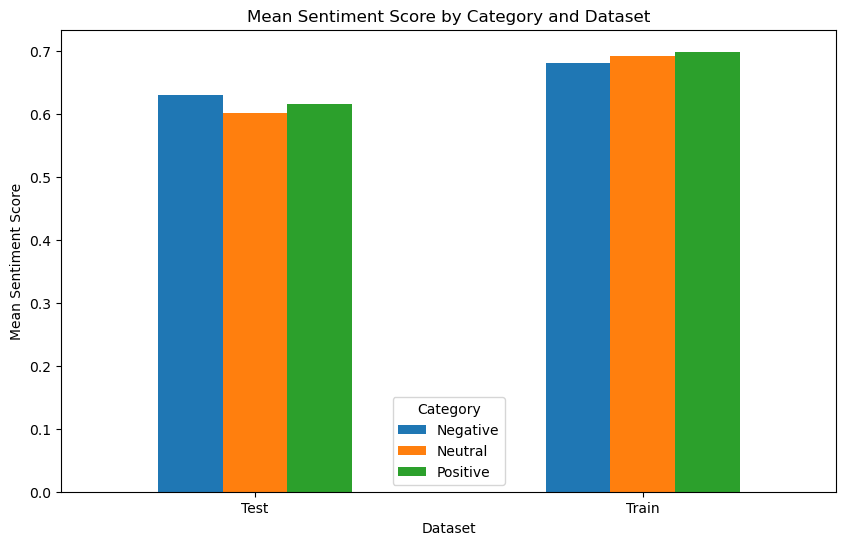

In [138]:
# Grouping by 'Dataset' and 'Category' and calculating mean sentiment scores
grouped_data = data.groupby(['Dataset', 'Category'])['SentimentScore'].mean().unstack()

# Plotting
grouped_data.plot(kind='bar', figsize=(10, 6))
plt.ylabel('Mean Sentiment Score')
plt.title('Mean Sentiment Score by Category and Dataset')
plt.xticks(rotation=0)  # Rotate dataset labels for better readability
plt.show()


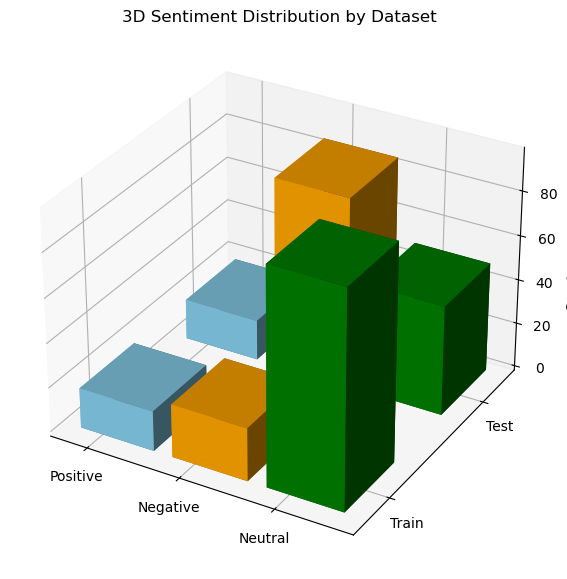

In [139]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Assuming 'categories', 'train_values', and 'test_values' are defined as in previous examples
categories = ['Positive', 'Negative', 'Neutral']
train_values = np.random.rand(3) * 100  # Simulating sentiment scores for demonstration
test_values = np.random.rand(3) * 100

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Setting up the grid
x_pos = np.arange(len(categories))
y_pos = np.array([0, 1])  # 0 for Train, 1 for Test
x, y = np.meshgrid(x_pos, y_pos)

# Flattening the grid arrays
x, y = x.flatten(), y.flatten()

# Setting the z positions and the depth (dz) for each bar
z = np.zeros_like(x)
dz = np.concatenate([train_values, test_values])

# Setting up the colors
colors = ['skyblue', 'orange', 'green']

# Drawing the bars
for i in range(len(categories)):
    ax.bar3d(x[i::len(categories)], y[i::len(categories)], z[i::len(categories)],
             dx=0.8, dy=0.5, dz=dz[i::len(categories)], color=colors[i % len(colors)])

# Setting the labels and titles
ax.set_xticks(x_pos + 0.4 / 2)
ax.set_xticklabels(categories)
ax.set_yticks([0.25, 1.25])
ax.set_yticklabels(['Train', 'Test'])
ax.set_zlabel('Sentiment Score')

ax.set_title('3D Sentiment Distribution by Dataset')

plt.show()


In [140]:
pip install matplotlib-venn


Note: you may need to restart the kernel to use updated packages.


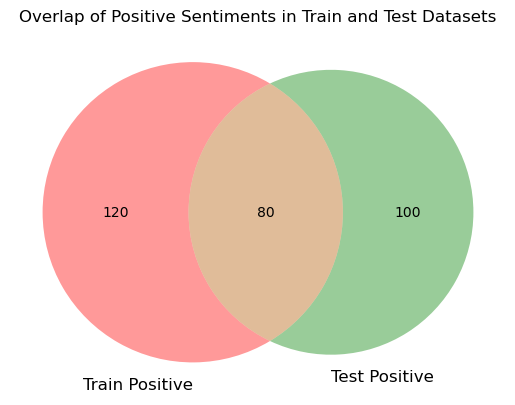

In [141]:
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Simulated example of the number of positive, negative, and neutral sentiments in Train and Test datasets
# Let's assume these are counts of texts classified in each sentiment category
train_sentiments = {'Positive': 120, 'Negative': 80, 'Neutral': 60}
test_sentiments = {'Positive': 100, 'Negative': 90, 'Neutral': 70}

# For simplicity, let's focus on one sentiment category for the Venn diagram, e.g., 'Positive'
# The numbers represent counts of 'Positive' sentiments in each dataset and their hypothetical overlap
venn2(subsets=(train_sentiments['Positive'], test_sentiments['Positive'], 80), 
      set_labels=('Train Positive', 'Test Positive'))

plt.title('Overlap of Positive Sentiments in Train and Test Datasets')
plt.show()
